# Image Caption Generator
Image caption generator is a model which generates caption based on the features present in the input image.

## Introduction
The basic working of the project is that the features are extracted from the images using pre-trained VGG16 model and then fed to the LSTM model along with the captions to train. The trained model is then capable of generating captions for any images that are fed to it.

## Dataset
The dataset used here is the **[FLICKR 8K](https://forms.illinois.edu/sec/1713398)** which consists of around 8091 images along with 5 captions for each images. 
If you have a powerful system with more than 16 GB RAM and a graphic card with more than 4 GB of memory, you can try to take **[FLICKR 30K](http://web.engr.illinois.edu/~bplumme2/Flickr30kEntities/)** which has around 30,000 images with captions.

## Dependencies
* Keras
* Tensorflow GPU
* Pre-trained VGG-16 weights
* NLTK
* Matplotlib

## Steps to follow:

### Importing the required libraries

In [0]:
!pip install pydot

Collecting pydot
 Downloading pydot-1.4.2-py2.py3-none-any.whl (21 kB)
Requirement already satisfied: pyparsing>=2.1.4 in /databricks/python3/lib/python3.8/site-packages (from pydot) (2.4.7)
Installing collected packages: pydot
Successfully installed pydot-1.4.2
 WARNING: You are using pip version 21.0.1; however, version 22.3 is available.
You should consider upgrading via the '/databricks/python3/bin/python -m pip install --upgrade pip' command.

In [0]:
!pip install tensorflow

Collecting tensorflow
 Downloading tensorflow-2.10.0-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (578.1 MB)
 | 10 kB 26.9 MB/s eta 0:00:22 | | 20 kB 20.0 MB/s eta 0:00:29 | | 30 kB 15.2 MB/s eta 0:00:38 | | 40 kB 9.7 MB/s eta 0:01:00 | | 51 kB 9.6 MB/s eta 0:01:01 | | 61 kB 11.0 MB/s eta 0:00:53 | | 71 kB 10.4 MB/s eta 0:00:56 | | 81 kB 9.1 MB/s eta 0:01:04 | | 92 kB 10.2 MB/s eta 0:00:57 | | 102 kB 10.2 MB/s eta 0:00:57 | | 112 kB 10.2 MB/s eta 0:00:57 | | 122 kB 10.2 MB/s eta 0:00:57 | | 133 kB 10.2 MB/s eta 0:00:57 | | 143 kB 10.2 MB/s eta 0:00:57 | | 153 kB 10.2 MB/s eta 0:00:57 | | 163 kB 10.2 MB/s eta 0:00:57 | | 174 kB 10.2 MB/s eta 0:00:57 | | 184 kB 10.2 MB/s eta 0:00:57 | | 194 kB 10.2 MB/s eta 0:00:57 | | 204 kB 10.2 MB/s eta 0:00:57 | | 215 kB 10.2 MB/s eta 0:00:57 | | 225 kB 10.2 MB/s eta 0:00:57 | | 235 kB 10.2 MB/s eta 0:00:57 | | 245 kB 10.2 MB/s eta 0:00:57 | | 256 kB 10.2 MB/s eta 0:00:57 | | 266 kB 10.2 MB/s eta 0:00:57 | | 276 kB 10.2 MB/s eta 0:00:57 | | 286 kB 10.2 MB/s eta 0:00:57 | | 296 kB 10.2 MB/s eta 0:00:57 | | 307 kB 10.2 MB/s eta 0:00:57 | | 317 kB 10.2 MB/s eta 0:00:57 | | 327 kB 10.2 MB/s eta 0:00:57 | | 337 kB 10.2 MB/s eta 0:00:57 | | 348 kB 10.2 MB/s eta 0:00:57 | | 358 kB 10.2 MB/s eta 0:00:57 | | 368 kB 10.2 MB/s eta 0:00:57 | | 378 kB 10.2 MB/s eta 0:00:57 | | 389 kB 10.2 MB/s eta 0:00:57 | | 399 kB 10.2 MB/s eta 0:00:57 | | 409 kB 10.2 MB/s eta 0:00:57 | | 419 kB 10.2 MB/s eta 0:00:57 | | 430 kB 10.2 MB/s eta 0:00:57 | | 440 kB 10.2 MB/s eta 0:00:57 | | 450 kB 10.2 MB/s eta 0:00:57 | | 460 kB 10.2 MB/s eta 0:00:57 | | 471 kB 10.2 MB/s eta 0:00:57 | | 481 kB 10.2 MB/s eta 0:00:57 | | 491 kB 10.2 MB/s eta 0:00:57 | | 501 kB 10.2 MB/s eta 0:00:57 | | 512 kB 10.2 MB/s eta 0:00:57 | | 522 kB 10.2 MB/s eta 0:00:57 | | 532 kB 10.2 MB/s eta 0:00:57 | | 542 kB 10.2 MB/s eta 0:00:57 | | 552 kB 10.2 MB/s eta 0:00:57 | | 563 kB 10.2 MB/s eta 0:00:57 | | 573 kB 10.2 MB/s eta 0:00:57 | | 583 kB 10.2 MB/s eta 0:00:57 | | 593 kB 10.2 MB/s eta 0:00:57 | | 604 kB 10.2 MB/s eta 0:00:57 | | 614 kB 10.2 MB/s eta 0:00:57 | | 624 kB 10.2 MB/s eta 0:00:57 | | 634 kB 10.2 MB/s eta 0:00:57 | | 645 kB 10.2 MB/s eta 0:00:57 | | 655 kB 10.2 MB/s eta 0:00:57 | | 665 kB 10.2 MB/s eta 0:00:57 | | 675 kB 10.2 MB/s eta 0:00:57 | | 686 kB 10.2 MB/s eta 0:00:57 | | 696 kB 10.2 MB/s eta 0:00:57 | | 706 kB 10.2 MB/s eta 0:00:57 | | 716 kB 10.2 MB/s eta 0:00:57 | | 727 kB 10.2 MB/s eta 0:00:57 | | 737 kB 10.2 MB/s eta 0:00:57 | | 747 kB 10.2 MB/s eta 0:00:57 | | 757 kB 10.2 MB/s eta 0:00:57 | | 768 kB 10.2 MB/s eta 0:00:57 | | 778 kB 10.2 MB/s eta 0:00:57 | | 788 kB 10.2 MB/s eta 0:00:57 | | 798 kB 10.2 MB/s eta 0:00:57 | | 808 kB 10.2 MB/s eta 0:00:57 | | 819 kB 10.2 MB/s eta 0:00:57 | | 829 kB 10.2 MB/s eta 0:00:57 | | 839 kB 10.2 MB/s eta 0:00:57 | | 849 kB 10.2 MB/s eta 0:00:57 | | 860 kB 10.2 MB/s eta 0:00:57 | | 870 kB 10.2 MB/s eta 0:00:57 | | 880 kB 10.2 MB/s eta 0:00:57 | | 890 kB 10.2 MB/s eta 0:00:57 | | 901 kB 10.2 MB/s eta 0:00:57 | | 911 kB 10.2 MB/s eta 0:00:57 | | 921 kB 10.2 MB/s eta 0:00:57 | | 931 kB 10.2 MB/s eta 0:00:57 | | 942 kB 10.2 MB/s eta 0:00:57 | | 952 kB 10.2 MB/s eta 0:00:57 | | 962 kB 10.2 MB/s eta 0:00:57 | | 972 kB 10.2 MB/s eta 0:00:57 | | 983 kB 10.2 MB/s eta 0:00:57 | | 993 kB 10.2 MB/s eta 0:00:57 | | 1.0 MB 10.2 MB/s eta 0:00:57 | | 1.0 MB 10.2 MB/s eta 0:00:57 | | 1.0 MB 10.2 MB/s eta 0:00:57 | | 1.0 MB 10.2 MB/s eta 0:00:57 | | 1.0 MB 10.2 MB/s eta 0:00:57 | | 1.1 MB 10.2 MB/s eta 0:00:57 | | 1.1 MB 10.2 MB/s eta 0:00:57 | | 1.1 MB 10.2 MB/s eta 0:00:57 | | 1.1 MB 10.2 MB/s eta 0:00:57 | | 1.1 MB 10.2 MB/s eta 0:00:57 | | 1.1 MB 10.2 MB/s eta 0:00:57 | | 1.1 MB 10.2 MB/s eta 0:00:57 | | 1.1 MB 10.2 MB/s eta 0:00:57 | | 1.1 MB 10.2 MB/s eta 0:00:57 | | 1.1 MB 10.2 MB/s eta 0:00:57 | | 1.2 MB 10.2 MB/s eta 0:00:57 | | 1.2 MB 10.2 MB/s eta 0:00:57 | | 1.2 MB 10.

In [0]:
import matplotlib.pyplot as plt
import tensorflow as tf
# from tensorflow.keras.backend.tensorflow_backend import set_session
import keras
import sys, time, os, warnings 
import numpy as np
import pandas as pd 
from collections import Counter 
warnings.filterwarnings("ignore")
print("python {}".format(sys.version))
print("keras version {}".format(keras.__version__)); del keras
print("tensorflow version {}".format(tf.__version__))

python 3.8.10 (default, Jun 22 2022, 20:18:18) 
[GCC 9.4.0]
keras version 2.10.0
tensorflow version 2.10.0

## Configuring the GPU memory to be used for training purposes

In [0]:
# config = tf.ConfigProto()
# config.gpu_options.per_process_gpu_memory_fraction = 0.95 #Using 95% of the available memory of the GPU
# config.gpu_options.visible_device_list = "0"
# set_session(tf.Session(config=config))

# def set_seed(sd=144):
#     from numpy.random import seed
#     from tensorflow import set_random_seed
#     import random as rn
#     ## numpy random seed
#     seed(sd)
#     ## core python's random number 
#     rn.seed(sd)
#     ## tensor flow's random number
#     set_random_seed(sd)

## Importing the image dataset and its respective captions

In [0]:
## The location of the Flickr8K_ images
dir_Flickr_jpg = "/dbfs/FileStore/Pankaj/Flicker8k_Dataset"
## The location of the caption file
dir_Flickr_text = "/dbfs/FileStore/Pankaj/Flickr8k.token.txt"

jpgs = os.listdir(dir_Flickr_jpg)
print("The number of jpg flies in Flicker8k: {}".format(len(jpgs)))

The number of jpg flies in Flicker8k: 8100

In [0]:
#Finding the captions for each image.
file = open(dir_Flickr_text,'r', encoding='utf8')
text = file.read()
file.close()


datatxt = []
for line in text.split('\n'):
    col = line.split('\t')
    if len(col) == 1:
        continue
    w = col[0].split("#") # Splitting the caption dataset at the required position
    datatxt.append(w + [col[1].lower()])

df_txt = pd.DataFrame(datatxt,columns=["filename","index","caption"])


uni_filenames = np.unique(df_txt.filename.values)
print("The number of unique file names : {}".format(len(uni_filenames)))
print("The distribution of the number of captions for each image:")
Counter(Counter(df_txt.filename.values).values())
print(df_txt[:5])

The number of unique file names : 8092
The distribution of the number of captions for each image:
 filename ... caption
0 1000268201_693b08cb0e.jpg ... a child in a pink dress is climbing up a set o...
1 1000268201_693b08cb0e.jpg ... a girl going into a wooden building .
2 1000268201_693b08cb0e.jpg ... a little girl climbing into a wooden playhouse .
3 1000268201_693b08cb0e.jpg ... a little girl climbing the stairs to her playh...
4 1000268201_693b08cb0e.jpg ... a little girl in a pink dress going into a woo...

[5 rows x 3 columns]

## Plotting few images and their captions from the dataset

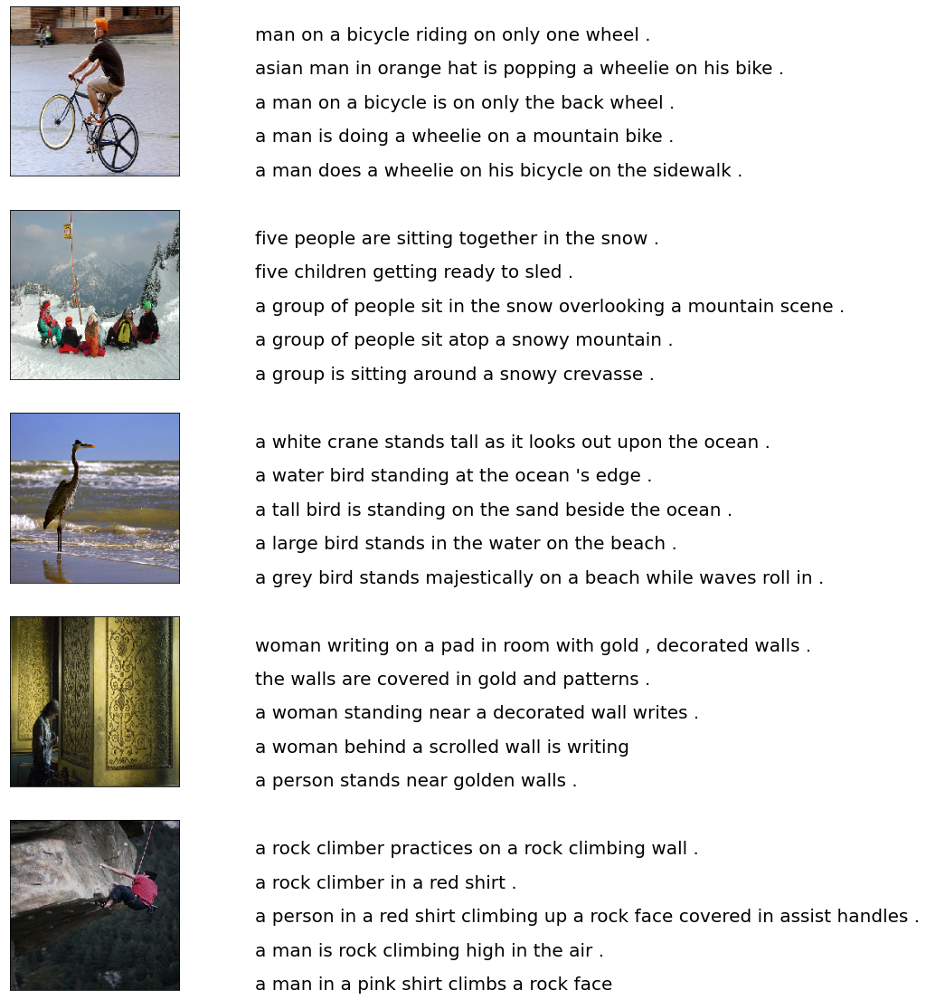

In [0]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from IPython.display import display
from PIL import Image

npic = 5 # Displaying 5 images from the dataset
npix = 224
target_size = (npix,npix,3)

count = 1
fig = plt.figure(figsize=(10,20))
for jpgfnm in uni_filenames[-5:]:
    filename = dir_Flickr_jpg + '/' + jpgfnm
    captions = list(df_txt["caption"].loc[df_txt["filename"]==jpgfnm].values)
    image_load = load_img(filename, target_size=target_size)
    
    ax = fig.add_subplot(npic,2,count,xticks=[],yticks=[])
    ax.imshow(image_load)
    count += 1
    
    ax = fig.add_subplot(npic,2,count)
    plt.axis('off')
    ax.plot()
    ax.set_xlim(0,1)
    ax.set_ylim(0,len(captions))
    for i, caption in enumerate(captions):
        ax.text(0,i,caption,fontsize=20)
    count += 1
plt.show()

## Cleaning captions for further analysis

In [0]:
# Defining a function to calculate the top 3 words in all the captions available for the images
def df_word(df_txt):
    vocabulary = []
    for txt in df_txt.caption.values:
        vocabulary.extend(txt.split())
    print('Vocabulary Size: %d' % len(set(vocabulary)))
    ct = Counter(vocabulary)
    dfword = pd.DataFrame({"word":list(ct.keys()),"count":list(ct.values())})
    dfword = dfword.sort_values("count",ascending=False)
    dfword = dfword.reset_index()[["word","count"]]
    return(dfword)
dfword = df_word(df_txt)
dfword.head(3)

Vocabulary Size: 8918
Out[12]:

,word,count
0,a,62989
1,.,36581
2,in,18975


## Cleaning the captions for further processing
The caption dataset contains punctuations, singular words and numerical values that need to be cleaned before it is fed to the model because uncleaned dataset will not create good captionsfor the images

In [0]:
import string
text_original = "I ate 1000 apples and a banana. I have python v2.7. It's 2:30 pm. Could you buy me iphone7?"

print(text_original)
print("\nRemove punctuations..")
def remove_punctuation(text_original):
    text_no_punctuation = text_original.translate(str.maketrans('','',string.punctuation))
    return(text_no_punctuation)
text_no_punctuation = remove_punctuation(text_original)
print(text_no_punctuation)


print("\nRemove a single character word..")
def remove_single_character(text):
    text_len_more_than1 = ""
    for word in text.split():
        if len(word) > 1:
            text_len_more_than1 += " " + word
    return(text_len_more_than1)
text_len_more_than1 = remove_single_character(text_no_punctuation)
print(text_len_more_than1)

print("\nRemove words with numeric values..")
def remove_numeric(text,printTF=False):
    text_no_numeric = ""
    for word in text.split():
        isalpha = word.isalpha()
        if printTF:
            print("    {:10} : {:}".format(word,isalpha))
        if isalpha:
            text_no_numeric += " " + word
    return(text_no_numeric)
text_no_numeric = remove_numeric(text_len_more_than1,printTF=True)
print(text_no_numeric)

I ate 1000 apples and a banana. I have python v2.7. It's 2:30 pm. Could you buy me iphone7?

Remove punctuations..
I ate 1000 apples and a banana I have python v27 Its 230 pm Could you buy me iphone7

Remove a single character word..
 ate 1000 apples and banana have python v27 Its 230 pm Could you buy me iphone7

Remove words with numeric values..
 ate : True
 1000 : False
 apples : True
 and : True
 banana : True
 have : True
 python : True
 v27 : False
 Its : True
 230 : False
 pm : True
 Could : True
 you : True
 buy : True
 me : True
 iphone7 : False
 ate apples and banana have python Its pm Could you buy me

In [0]:
def text_clean(text_original):
    text = remove_punctuation(text_original)
    text = remove_single_character(text)
    text = remove_numeric(text)
    return(text)


for i, caption in enumerate(df_txt.caption.values):
    newcaption = text_clean(caption)
    df_txt["caption"].iloc[i] = newcaption

## Plotting the top 50 words that appear in the cleaned dataset

Vocabulary Size: 8763

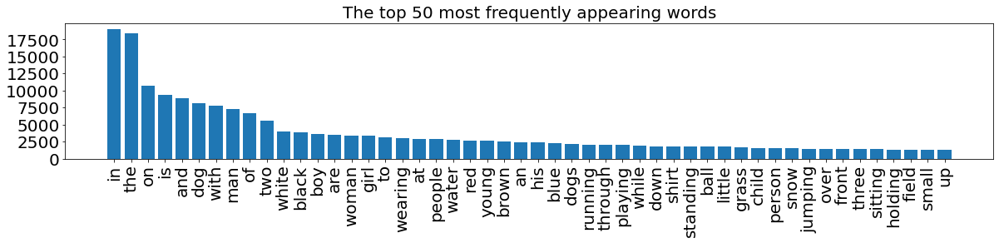

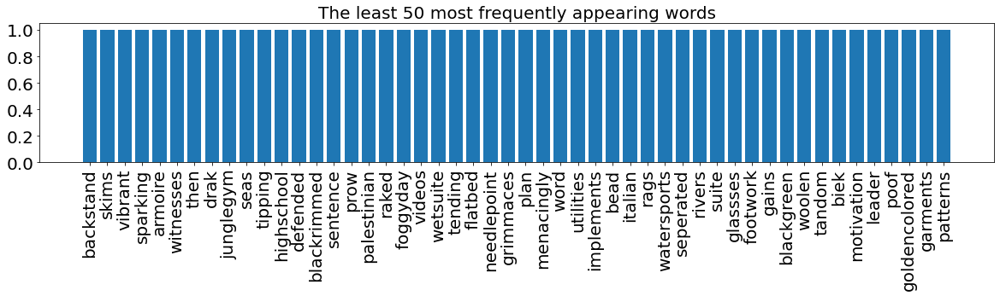

In [0]:
topn = 50

def plthist(dfsub, title="The top 50 most frequently appearing words"):
    plt.figure(figsize=(20,3))
    plt.bar(dfsub.index,dfsub["count"])
    plt.yticks(fontsize=20)
    plt.xticks(dfsub.index,dfsub["word"],rotation=90,fontsize=20)
    plt.title(title,fontsize=20)
    plt.show()
dfword = df_word(df_txt)
plthist(dfword.iloc[:topn,:],
        title="The top 50 most frequently appearing words")
plthist(dfword.iloc[-topn:,:],
        title="The least 50 most frequently appearing words")

## Adding start and end sequence tokens for each captions 
Start and end sequence has to be added to the tokens so that it is easier to identify the captions for the images as each of them are of different length

In [0]:
from copy import copy
def add_start_end_seq_token(captions):
    caps = []
    for txt in captions:
        txt = 'startseq ' + txt + ' endseq'
        caps.append(txt)
    return(caps)
df_txt0 = copy(df_txt)
df_txt0["caption"] = add_start_end_seq_token(df_txt["caption"])
df_txt0.head(5)
del df_txt

In [0]:
df_txt0[:5]

Out[17]:

,filename,index,caption
0,1000268201_693b08cb0e.jpg,0,startseq child in pink dress is climbing up s...
1,1000268201_693b08cb0e.jpg,1,startseq girl going into wooden building endseq
2,1000268201_693b08cb0e.jpg,2,startseq little girl climbing into wooden pla...
3,1000268201_693b08cb0e.jpg,3,startseq little girl climbing the stairs to h...
4,1000268201_693b08cb0e.jpg,4,startseq little girl in pink dress going into...


## Loading VGG16 model and weights to extract features from the images
The pre-trained weights for the VGG-16 model can be downloaded from [here](https://github.com/fchollet/deep-learning-models/releases/download/v0.1/vgg16_weights_tf_dim_ordering_tf_kernels.h5).

In [0]:
from keras.applications import VGG16

modelvgg = VGG16(include_top=True,weights='imagenet')
## load the locally saved weights 
# modelvgg.load_weights("Data/vgg16_weights_tf_dim_ordering_tf_kernels.h5")
modelvgg.summary()

Downloading data from https://storage.googleapis.com/tensorflow/keras-applications/vgg16/vgg16_weights_tf_dim_ordering_tf_kernels.h5
 8192/553467096 [..............................] - ETA: 0s 3555328/553467096 [..............................] - ETA: 7s 4202496/553467096 [..............................] - ETA: 16s 22700032/553467096 [>.............................] - ETA: 4s  33562624/553467096 [>.............................] - ETA: 3s 49659904/553467096 [=>............................] - ETA: 3s 67117056/553467096 [==>...........................] - ETA: 2s 78651392/553467096 [===>..........................] - ETA: 2s 92872704/553467096 [====>.........................] - ETA: 2s105758720/553467096 [====>.........................] - ETA: 2s115097600/553467096 [=====>........................] - ETA: 2s128155648/553467096 [=====>........................] - ETA: 2s138215424/553467096 [======>.......................] - ETA: 2s146825216/553467096 [======>.......................] - ETA: 2s159391744/553467096 [=======>......................] - ETA: 1s176168960/553467096 [========>.....................] - ETA: 1s192077824/553467096 [=========>....................] - ETA: 1s192946176/553467096 [=========>....................] - ETA: 1s211615744/553467096 [==========>...................] - ETA: 1s226500608/553467096 [===========>..................] - ETA: 1s243449856/553467096 [============>.................] - ETA: 1s260055040/553467096 [=============>................] - ETA: 1s278757376/553467096 [==============>...............] - ETA: 1s293609472/553467096 [==============>...............] - ETA: 1s310386688/553467096 [===============>..............] - ETA: 1s327163904/553467096 [================>.............] - ETA: 1s343941120/553467096 [=================>............] - ETA: 0s360718336/553467096 [==================>...........] - ETA: 0s377495552/553467096 [===================>..........] - ETA: 0s387235840/553467096 [===================>..........] - ETA: 0s402661376/553467096 [====================>.........] - ETA: 0s

## Deleting the last layer of the model 
The last layer of the VGG-16 is excluded here because we are are just using it for extracting the features rather than using for object classification.

In [0]:
from keras import models
modelvgg.layers.pop()
modelvgg = models.Model(inputs=modelvgg.inputs, outputs=modelvgg.layers[-2].output)
## show the deep learning model
modelvgg.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type) Output Shape Param # 
=================================================================
 input_2 (InputLayer) [(None, 224, 224, 3)] 0 
 
 block1_conv1 (Conv2D) (None, 224, 224, 64) 1792 
 
 block1_conv2 (Conv2D) (None, 224, 224, 64) 36928 
 
 block1_pool (MaxPooling2D) (None, 112, 112, 64) 0 
 
 block2_conv1 (Conv2D) (None, 112, 112, 128) 73856 
 
 block2_conv2 (Conv2D) (None, 112, 112, 128) 147584 
 
 block2_pool (MaxPooling2D) (None, 56, 56, 128) 0 
 
 block3_conv1 (Conv2D) (None, 56, 56, 256) 295168 
 
 block3_conv2 (Conv2D) (None, 56, 56, 256) 590080 
 
 block3_conv3 (Conv2D) (None, 56, 56, 256) 590080 
 
 block3_pool (MaxPooling2D) (None, 28, 28, 256) 0 
 
 block4_conv1 (Conv2D) (None, 28, 28, 512) 1180160 
 
 block4_conv2 (Conv2D) (None, 28, 28, 512) 2359808 
 
 block4_conv3 (Conv2D) (None, 28, 28, 512) 2359808 
 
 block4_pool (MaxPooling2D) (None, 14, 14, 512) 0 
 
 block5_conv1 (Conv2D) (None, 14, 14, 512) 2359808 
 
 block5_conv2 (Conv2D) (None, 14, 14, 512) 2359808 
 
 block5_conv3 (Conv2D) (None, 14, 14, 512) 2359808 
 
 block5_pool (MaxPooling2D) (None, 7, 7, 512) 0 
 
 flatten (Flatten) (None, 25088) 0 
 
 fc1 (Dense) (None, 4096) 102764544 
 
 fc2 (Dense) (None, 4096) 16781312 
 
=================================================================
Total params: 134,260,544
Trainable params: 134,260,544
Non-trainable params: 0
_________________________________________________________________

## Feature extraction
Here the features are extracted from all the images in the dataset. VGG-16 model gives out 4096 features from the input image of size 224 * 224

In [0]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.vgg16 import preprocess_input
from collections import OrderedDict

images = OrderedDict()
npix = 224 #image size is fixed at 224 because VGG16 model has been pre-trained to take that size.
target_size = (npix,npix,3)
data = np.zeros((len(jpgs),npix,npix,3))
for i,name in enumerate(jpgs):
    # load an image from file
    filename = dir_Flickr_jpg + '/' + name
    image = load_img(filename, target_size=target_size)
    # convert the image pixels to a numpy array
    image = img_to_array(image)
    nimage = preprocess_input(image)
    
    y_pred = modelvgg.predict(nimage.reshape( (1,) + nimage.shape[:3]))
    images[name] = y_pred.flatten()

1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 261ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 81ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 79ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 80ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 78ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 77ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 76ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 80ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 78ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 80ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 80ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 80ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 81ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 78ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 79ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 80ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 78ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 78ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 80ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 77ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 77ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 81ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 81ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 78ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 79ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 79ms/step
1/1 [==============================] - ETA: 0s1/1 [==============================] - 0s 79ms/step
1/1 [==============================] - ETA: 0s

## Plotting similar images from the dataset
For this we have to first create a cluster and find which images belong together. Hence PCA is used to reduce the dimensions of the features which we got from VGG-16 festure extraction from **4096** to **2**

First the clusters are plotted and few examples are taken from the bunch for displaying

In [0]:
from sklearn.decomposition import PCA

encoder = np.array(list(images.values()))
#print(encoder)
pca = PCA(n_components=2)
#print(pca)
y_pca = pca.fit_transform(encoder)

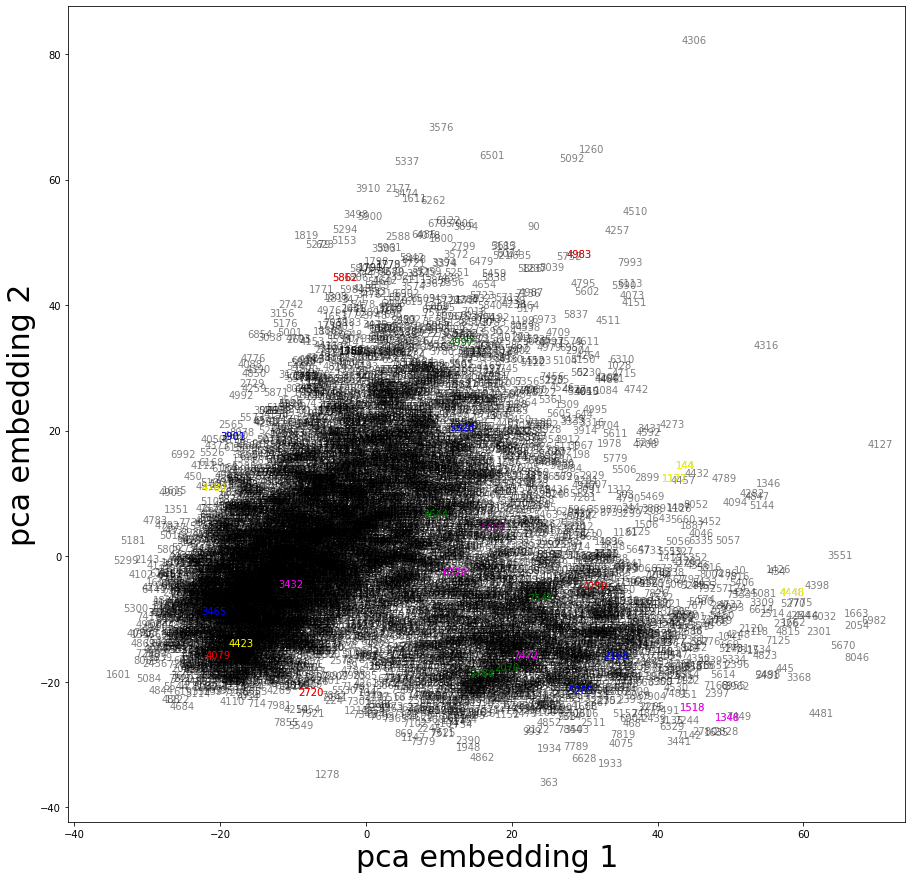

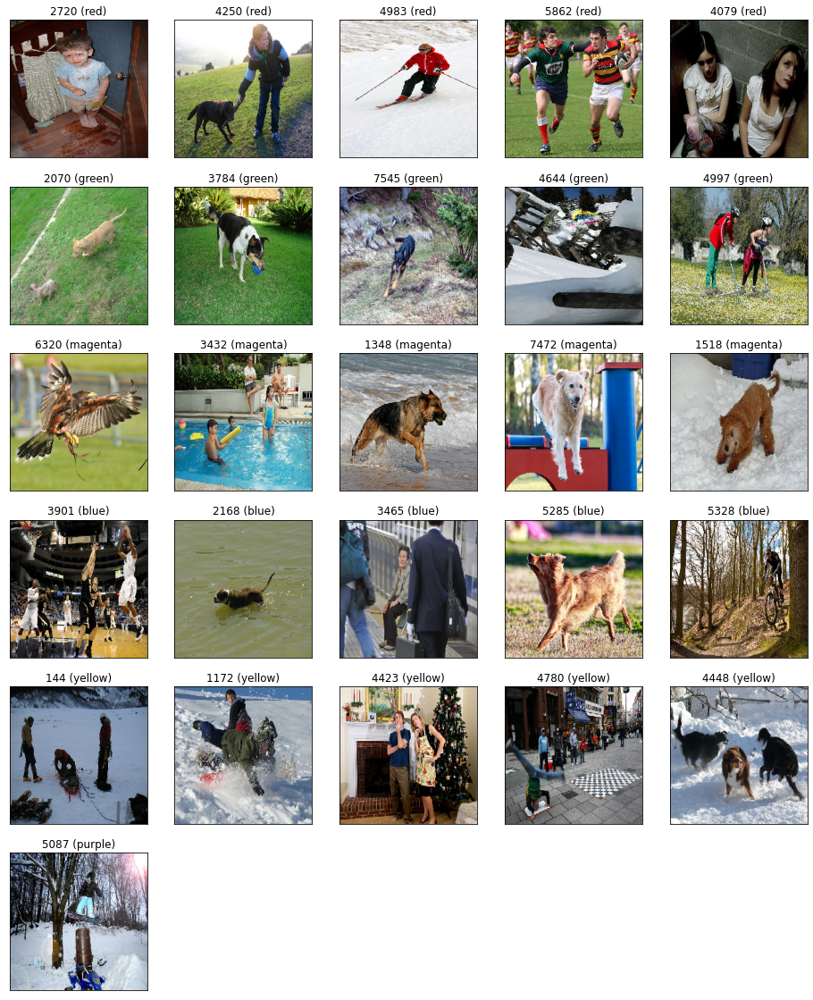

In [0]:
## some selected pictures that are creating clusters
#these are just to display the related images from the dataset
picked_pic = OrderedDict()
picked_pic["red"]     = [2720,4250,4983,5862,4079]
picked_pic["green"]   = [2070,3784,7545,4644, 4997]
picked_pic["magenta"] = [6320,3432,1348,7472, 1518]
picked_pic["blue"]    = [3901,2168,3465,5285,5328]
picked_pic["yellow"]  = [144,1172,4423,4780,4448]
picked_pic["purple"]  = [5087]

fig, ax = plt.subplots(figsize=(15,15))
ax.scatter(y_pca[:,0],y_pca[:,1],c="white")

for irow in range(y_pca.shape[0]):
    ax.annotate(irow,y_pca[irow,:],color="black",alpha=0.5) #annotate() is used to place text at the location of the point
for color, irows in picked_pic.items():
    for irow in irows:
        ax.annotate(irow,y_pca[irow,:],color=color)
ax.set_xlabel("pca embedding 1",fontsize=30)
ax.set_ylabel("pca embedding 2",fontsize=30)
plt.show()


## plot of images 
fig = plt.figure(figsize=(16,20))
count = 1
for color, irows in picked_pic.items():
    for ivec in irows:
        name = jpgs[ivec]
        filename = dir_Flickr_jpg + '/' + name
        image = load_img(filename, target_size=target_size)
    
        ax = fig.add_subplot(len(picked_pic),5,count,
                         xticks=[],yticks=[])
        count += 1
        plt.imshow(image)
        plt.title("{} ({})".format(ivec,color))
plt.show()

## Merging the images and the captions for training

In [0]:
dimages, keepindex = [],[]
# Creating a datframe where only first caption is taken for processing
df_txt0 = df_txt0.loc[df_txt0["index"].values == "0",: ]
for i, fnm in enumerate(df_txt0.filename):
    if fnm in images.keys():
        dimages.append(images[fnm])
        keepindex.append(i)

#fnames are the names of the image files        
fnames = df_txt0["filename"].iloc[keepindex].values
#dcaptions are the captions of the images 
dcaptions = df_txt0["caption"].iloc[keepindex].values
#dimages are the actual features of the images
dimages = np.array(dimages)

In [0]:
df_txt0[:5]

Out[27]:

,filename,index,caption
0,1000268201_693b08cb0e.jpg,0,startseq child in pink dress is climbing up s...
5,1001773457_577c3a7d70.jpg,0,startseq black dog and spotted dog are fighti...
10,1002674143_1b742ab4b8.jpg,0,startseq little girl covered in paint sits in...
15,1003163366_44323f5815.jpg,0,startseq man lays on bench while his dog sits...
20,1007129816_e794419615.jpg,0,startseq man in an orange hat starring at som...


## Tokenizing the captions for further processing
As the model can't take texts as an input, they need to converted into vectors.

In [0]:
from keras.preprocessing.text import Tokenizer
## the maximum number of words in dictionary
nb_words = 6000
tokenizer = Tokenizer(nb_words=nb_words)
tokenizer.fit_on_texts(dcaptions)
vocab_size = len(tokenizer.word_index) + 1
print("vocabulary size : {}".format(vocab_size))
dtexts = tokenizer.texts_to_sequences(dcaptions)
print(dtexts[:5])

vocabulary size : 4476
[[1, 38, 3, 66, 144, 7, 124, 52, 406, 9, 367, 3, 24, 2351, 522, 2], [1, 12, 8, 5, 752, 8, 17, 368, 2], [1, 48, 15, 170, 3, 584, 101, 3, 41, 9, 551, 1198, 11, 55, 213, 3, 1076, 2], [1, 10, 621, 6, 150, 27, 23, 8, 101, 46, 112, 2], [1, 10, 3, 24, 82, 96, 1199, 19, 162, 2]]

## Splitting the training and test data

In [0]:
prop_test, prop_val = 0.2, 0.2 

N = len(dtexts)
Ntest, Nval = int(N*prop_test), int(N*prop_val)

def split_test_val_train(dtexts,Ntest,Nval):
    return(dtexts[:Ntest], 
           dtexts[Ntest:Ntest+Nval],  
           dtexts[Ntest+Nval:])

dt_test,  dt_val, dt_train   = split_test_val_train(dtexts,Ntest,Nval)
di_test,  di_val, di_train   = split_test_val_train(dimages,Ntest,Nval)
fnm_test,fnm_val, fnm_train  = split_test_val_train(fnames,Ntest,Nval)

In [0]:
len(dtexts)

Out[64]: 8091

## Finding the max length of the caption

In [0]:
maxlen = np.max([len(text) for text in dtexts])
print(maxlen)

30

## Processing the captions and images as per the required shape by the model

In [0]:
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical

def preprocessing(dtexts,dimages):
    N = len(dtexts)
    print("# captions/images = {}".format(N))

    assert(N==len(dimages)) # using assert to make sure that length of images and captions are always similar
    Xtext, Ximage, ytext = [],[],[]
    for text,image in zip(dtexts,dimages):
        # zip() is used to create a tuple of iteratable items
        for i in range(1,len(text)):
            in_text, out_text = text[:i], text[i]
            in_text = pad_sequences([in_text],maxlen=maxlen).flatten()# using pad sequence to make the length of all captions equal
            out_text = to_categorical(out_text,num_classes = vocab_size) # using to_categorical to 

            
            Xtext.append(in_text)
            Ximage.append(image)
            ytext.append(out_text)

    Xtext  = np.array(Xtext)
    Ximage = np.array(Ximage)
    ytext  = np.array(ytext)
    print(" {} {} {}".format(Xtext.shape,Ximage.shape,ytext.shape))
    return(Xtext,Ximage,ytext)


Xtext_train, Ximage_train, ytext_train = preprocessing(dt_train,di_train)
Xtext_val,   Ximage_val,   ytext_val   = preprocessing(dt_val,di_val)
# pre-processing is not necessary for testing data
#Xtext_test,  Ximage_test,  ytext_test  = preprocessing(dt_test,di_test)

# captions/images = 4855
 (49631, 30) (49631, 4096) (49631, 4476)
# captions/images = 1618
 (16353, 30) (16353, 4096) (16353, 4476)

## Building the LSTM model

In [0]:
from tensorflow.keras import layers
from tensorflow.keras.layers import Input, Flatten, Dropout, Activation
# from tensorflow.keras.layers.advanced_activations import LeakyReLU, PReLU
print(vocab_size)
## image feature

dim_embedding = 64

input_image = layers.Input(shape=(Ximage_train.shape[1],))
fimage = layers.Dense(256,activation='relu',name="ImageFeature")(input_image)
## sequence model
input_txt = layers.Input(shape=(maxlen,))
ftxt = layers.Embedding(vocab_size,dim_embedding, mask_zero=True)(input_txt)
ftxt = layers.LSTM(256,name="CaptionFeature",return_sequences=True)(ftxt)
#,return_sequences=True
#,activation='relu'
se2 = Dropout(0.04)(ftxt)
ftxt = layers.LSTM(256,name="CaptionFeature2")(se2)
## combined model for decoder
decoder = layers.add([ftxt,fimage])
decoder = layers.Dense(256,activation='relu')(decoder)
output = layers.Dense(vocab_size,activation='softmax')(decoder)
model = models.Model(inputs=[input_image, input_txt],outputs=output)

model.compile(loss='categorical_crossentropy', optimizer='adam')

print(model.summary())

4476
Model: "model_2"
__________________________________________________________________________________________________
 Layer (type) Output Shape Param # Connected to 
==================================================================================================
 input_4 (InputLayer) [(None, 30)] 0 [] 
 
 embedding (Embedding) (None, 30, 64) 286464 ['input_4[0][0]'] 
 
 CaptionFeature (LSTM) (None, 30, 256) 328704 ['embedding[0][0]'] 
 
 dropout (Dropout) (None, 30, 256) 0 ['CaptionFeature[0][0]'] 
 
 input_3 (InputLayer) [(None, 4096)] 0 [] 
 
 CaptionFeature2 (LSTM) (None, 256) 525312 ['dropout[0][0]'] 
 
 ImageFeature (Dense) (None, 256) 1048832 ['input_3[0][0]'] 
 
 add (Add) (None, 256) 0 ['CaptionFeature2[0][0]', 
 'ImageFeature[0][0]'] 
 
 dense (Dense) (None, 256) 65792 ['add[0][0]'] 
 
 dense_1 (Dense) (None, 4476) 1150332 ['dense[0][0]'] 
 
==================================================================================================
Total params: 3,405,436
Trainable params: 3,405,436
Non-trainable params: 0
__________________________________________________________________________________________________
None

In [0]:
!pip install pydot
tf.keras.utils.plot_model(model)

Requirement already satisfied: pydot in /databricks/python3/lib/python3.8/site-packages (1.4.2)
Requirement already satisfied: pyparsing>=2.1.4 in /databricks/python3/lib/python3.8/site-packages (from pydot) (2.4.7)
 WARNING: You are using pip version 21.0.1; however, version 22.3 is available.
You should consider upgrading via the '/databricks/python3/bin/python -m pip install --upgrade pip' command. 
You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.

## Training the LSTM model

In [0]:
# fit model
from time import time
from keras.callbacks import TensorBoard
tensorboard = TensorBoard(log_dir="logs/{}".format(time()))
#start = time.time()
hist = model.fit([Ximage_train, Xtext_train], ytext_train, 
                  epochs=6, verbose=2, 
                  batch_size=32,
                  validation_data=([Ximage_val, Xtext_val], ytext_val),callbacks=[tensorboard])
#end = time.time()
#print("TIME TOOK {:3.2f}MIN".format((end - start )/60))

Epoch 1/6
1551/1551 - 107s - loss: 5.3371 - val_loss: 4.8481 - 107s/epoch - 69ms/step
Epoch 2/6
1551/1551 - 100s - loss: 4.4731 - val_loss: 4.5784 - 100s/epoch - 64ms/step
Epoch 3/6
1551/1551 - 100s - loss: 4.0627 - val_loss: 4.5093 - 100s/epoch - 65ms/step
Epoch 4/6
1551/1551 - 100s - loss: 3.7897 - val_loss: 4.5423 - 100s/epoch - 65ms/step
Epoch 5/6
1551/1551 - 100s - loss: 3.5854 - val_loss: 4.5800 - 100s/epoch - 65ms/step
Epoch 6/6
1551/1551 - 101s - loss: 3.4088 - val_loss: 4.6664 - 101s/epoch - 65ms/step

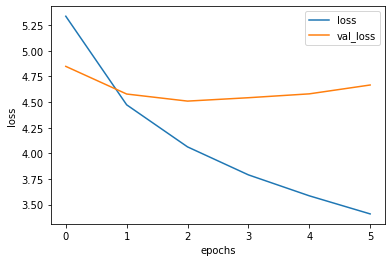

In [0]:
for label in ["loss","val_loss"]:
    plt.plot(hist.history[label],label=label)
plt.legend()
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

## Generating captions on a small set of images
After the model finishes training we can test out its performance on the some of the test images to figure out if the generated captions are good enough. If the generated captions are good enough we can generate the captions for the whole test dataset.

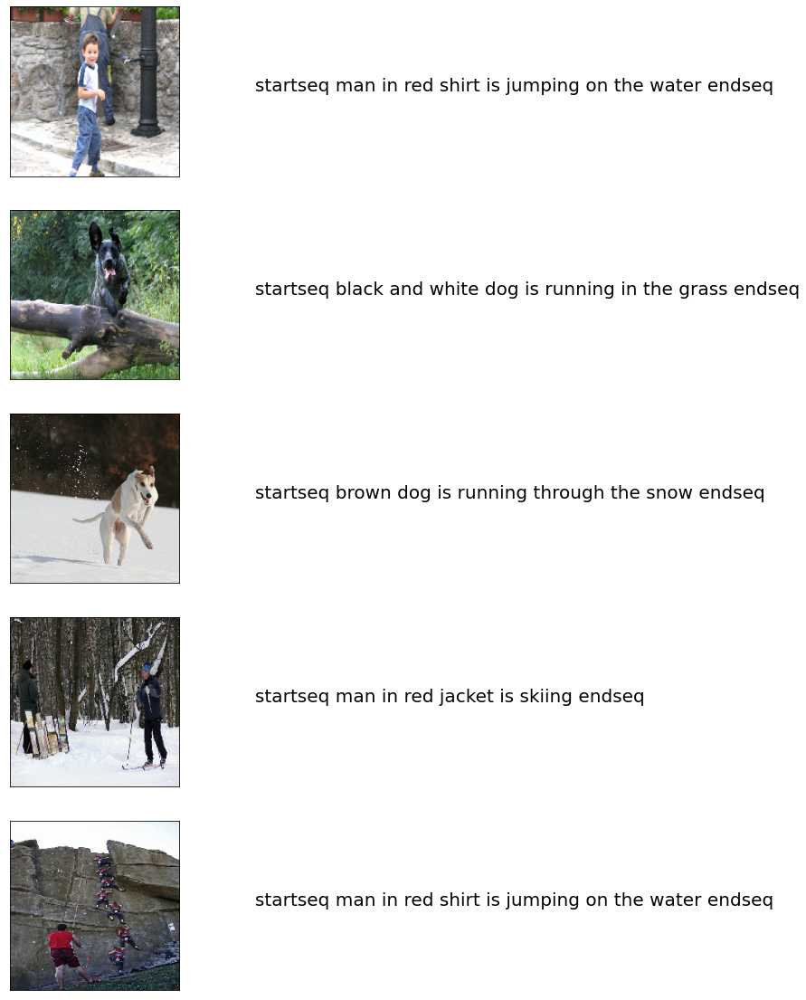

In [0]:
index_word = dict([(index,word) for word, index in tokenizer.word_index.items()])
def predict_caption(image):
    '''
    image.shape = (1,4462)
    '''

    in_text = 'startseq'

    for iword in range(maxlen):
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        sequence = pad_sequences([sequence],maxlen)
        yhat = model.predict([image,sequence],verbose=0)
        yhat = np.argmax(yhat)
        newword = index_word[yhat]
        in_text += " " + newword
        if newword == "endseq":
            break
    return(in_text)



npic = 5
npix = 224
target_size = (npix,npix,3)

count = 1
fig = plt.figure(figsize=(10,20))
for jpgfnm, image_feature in zip(fnm_test[8:13],di_test[8:13]):
    ## images 
    filename = dir_Flickr_jpg + '/' + jpgfnm
    image_load = load_img(filename, target_size=target_size)
    ax = fig.add_subplot(npic,2,count,xticks=[],yticks=[])
    ax.imshow(image_load)
    count += 1

    ## captions
    caption = predict_caption(image_feature.reshape(1,len(image_feature)))
    ax = fig.add_subplot(npic,2,count)
    plt.axis('off')
    ax.plot()
    ax.set_xlim(0,1)
    ax.set_ylim(0,1)
    ax.text(0,0.5,caption,fontsize=20)
    count += 1

plt.show()

startseq black and white dog is running in the grass endseq

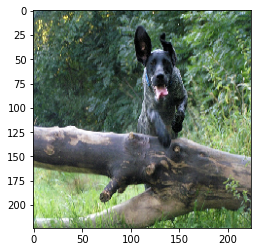

In [0]:
index_word = dict([(index,word) for word, index in tokenizer.word_index.items()])
def predict_caption(image):
    '''
    image.shape = (1,4096)
    '''

    in_text = 'startseq'

    for iword in range(maxlen):
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        sequence = pad_sequences([sequence],maxlen)
        yhat = model.predict([image,sequence],verbose = 0)
        yhat = np.argmax(yhat)
        newword = index_word[yhat]
        in_text += " " + newword
        if newword == "endseq":
            break
    return(in_text)
  
for jpgfnm in fnm_test[9:10]:
    ## images 
    filename = dir_Flickr_jpg + '/' + jpgfnm
    image = load_img(filename, target_size=target_size)
    plt.imshow(image)
    image = img_to_array(image)
    nimage = preprocess_input(image)
    
    y_pred = modelvgg.predict(nimage.reshape( (1,) + nimage.shape[:3]),verbose = 0)
    y_pred =  y_pred.flatten().reshape(1,len(image_feature))

    ## captions
    caption = predict_caption(y_pred)
    print(caption)

In [0]:
import pickle
file = open('/dbfs/FileStore/Pankaj/AI5_model_final','wb')
pickle.dump({'model_vgg':modelvgg,'model_caption':model},file)
file.close()

file = open('/dbfs/FileStore/Pankaj/AI5_token_final','wb')
pickle.dump({'token':tokenizer},file)
file.close()


WARNING:tensorflow:Compiled the loaded model, but the compiled metrics have yet to be built. `model.compile_metrics` will be empty until you train or evaluate the model.
WARNING:absl:Found untraced functions such as _jit_compiled_convolution_op, _jit_compiled_convolution_op, _jit_compiled_convolution_op, _jit_compiled_convolution_op, _jit_compiled_convolution_op while saving (showing 5 of 13). These functions will not be directly callable after loading.
INFO:tensorflow:Assets written to: ram://afd0ab93-7fb0-4966-b862-bcbb872463c7/assets
INFO:tensorflow:Assets written to: ram://afd0ab93-7fb0-4966-b862-bcbb872463c7/assets
WARNING:absl:Found untraced functions such as lstm_cell_layer_call_fn, lstm_cell_layer_call_and_return_conditional_losses, lstm_cell_1_layer_call_fn, lstm_cell_1_layer_call_and_return_conditional_losses while saving (showing 4 of 4). These functions will not be directly callable after loading.
INFO:tensorflow:Assets written to: ram://66f0862a-6f90-42f3-a805-fdfcf212db1d/assets
INFO:tensorflow:Assets written to: ram://66f0862a-6f90-42f3-a805-fdfcf212db1d/assets

## Evaluating the model performance
After the model is trained we have to test the models prediction capabilities on test dataset. Traditional accuracy metric can't be used on predictions. For text evaluations we have a metric called as [BLEU Score](https://machinelearningmastery.com/calculate-bleu-score-for-text-python/). BLEU stands for Bilingual Evaluation Understudy, it is a score for comparing a candidate text to one or more reference text.

Example:

In [0]:
hypothesis = "I like dog"
hypothesis = hypothesis.split()
reference  = "I do like dog"
references = [reference.split()] ## references must be a list containing list. 

In [0]:
!pip install nltk
from nltk.translate.bleu_score import sentence_bleu
print("BLEU={:4.3f}".format(sentence_bleu(references,hypothesis)))

Requirement already satisfied: nltk in /databricks/python3/lib/python3.8/site-packages (3.7)
Requirement already satisfied: joblib in /databricks/python3/lib/python3.8/site-packages (from nltk) (1.0.1)
Requirement already satisfied: click in /databricks/python3/lib/python3.8/site-packages (from nltk) (8.1.3)
Requirement already satisfied: regex>=2021.8.3 in /databricks/python3/lib/python3.8/site-packages (from nltk) (2022.10.31)
Requirement already satisfied: tqdm in /databricks/python3/lib/python3.8/site-packages (from nltk) (4.64.1)
 WARNING: You are using pip version 21.0.1; however, version 22.3 is available.
You should consider upgrading via the '/databricks/python3/bin/python -m pip install --upgrade pip' command. 
BLEU=0.000

In [0]:
hypothesis2 = "I love dog!".split()
print("BLEU={:4.3f}".format(sentence_bleu(references,  hypothesis2))) 

BLEU=0.000

## Generating captions for the whole test data and finding BLEU score

In [0]:
index_word = dict([(index,word) for word, index in tokenizer.word_index.items()])


nkeep = 5
pred_good, pred_bad, bleus = [], [], [] 
count = 0 
for jpgfnm, image_feature, tokenized_text in zip(fnm_test,di_test,dt_test):
    count += 1
    if count % 200 == 0:
        print("  {:4.2f}% is done..".format(100*count/float(len(fnm_test))))
    
    caption_true = [ index_word[i] for i in tokenized_text ]     
    caption_true = caption_true[1:-1] ## remove startreg, and endreg
    ## captions
    caption = predict_caption(image_feature.reshape(1,len(image_feature)))
    caption = caption.split()
    caption = caption[1:-1]## remove startreg, and endreg
    
    bleu = sentence_bleu([caption_true],caption)
    bleus.append(bleu)
    if bleu > 0.7 and len(pred_good) < nkeep:
        pred_good.append((bleu,jpgfnm,caption_true,caption))
    elif bleu < 0.3 and len(pred_bad) < nkeep:
        pred_bad.append((bleu,jpgfnm,caption_true,caption))

12.36% is done..

In [0]:
print("Mean BLEU {:4.3f}".format(np.mean(bleus)))

## Good and bad captions examples from the model
We can check out some of the generated caption's quality. Some times due to the complex nature of the images the generated captions are not acceptable. Below you would find some examples

Bad Caption


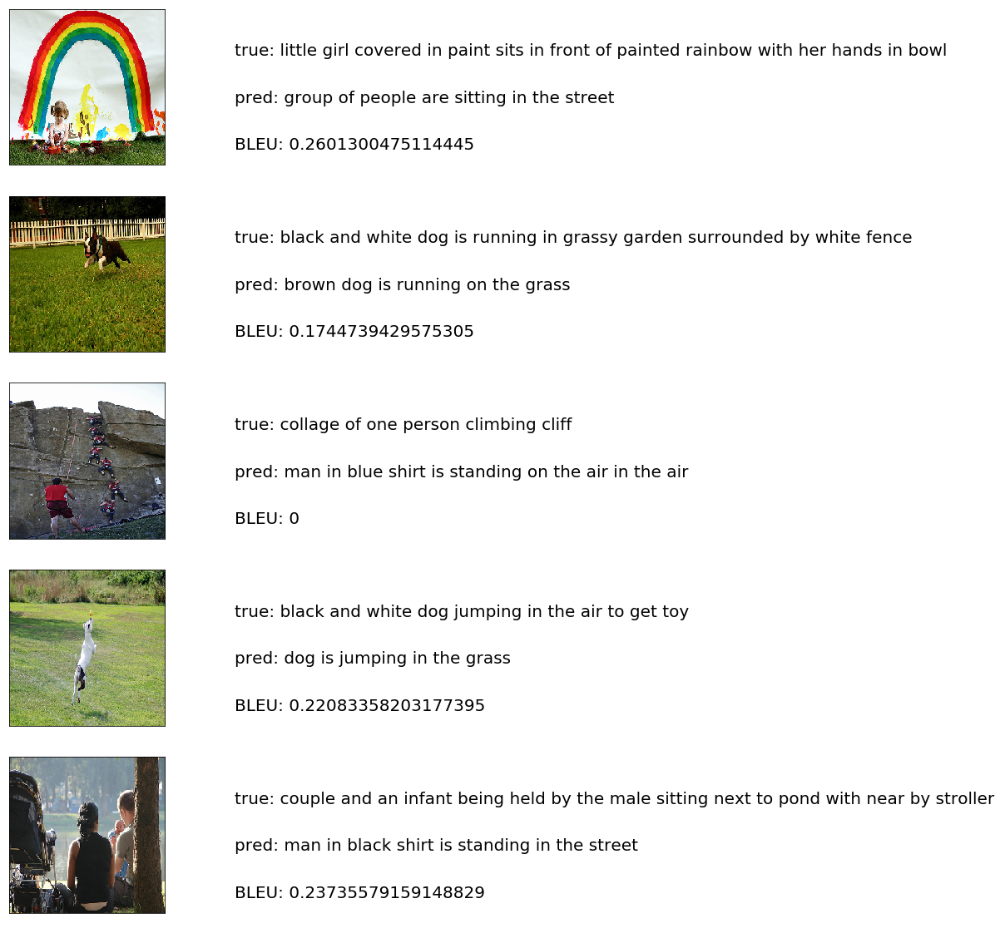

Good Caption


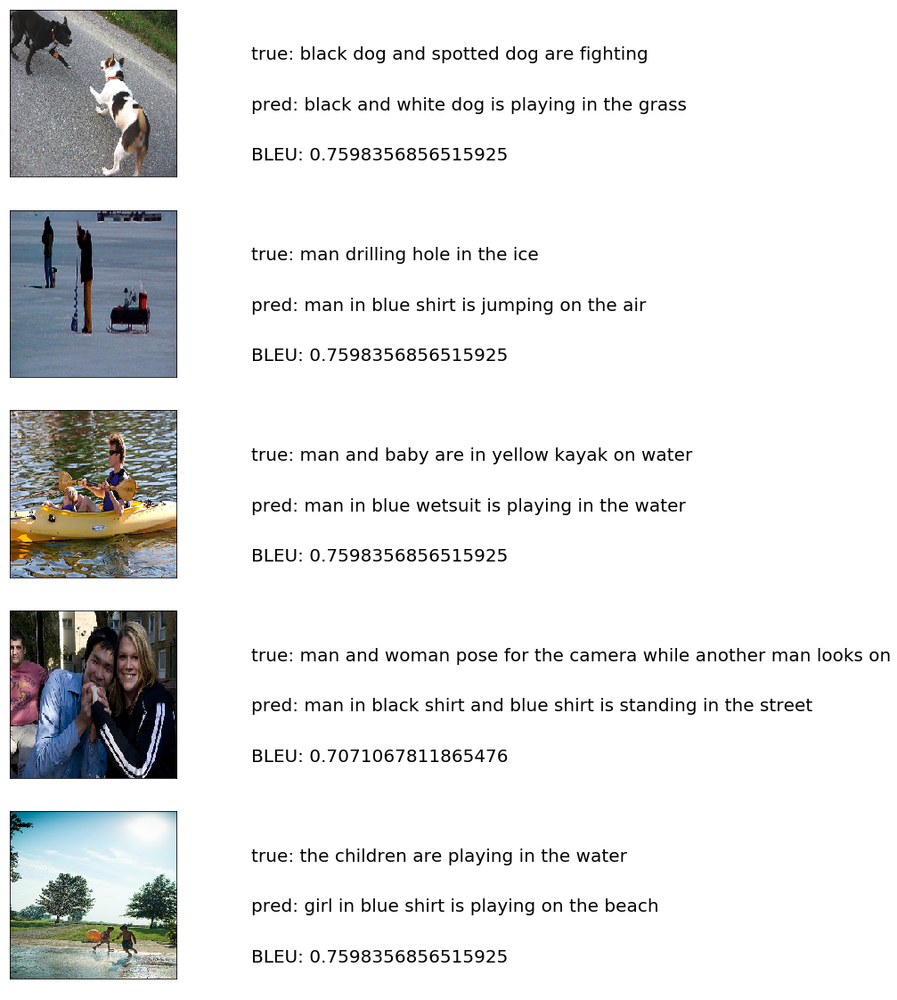

In [0]:
def plot_images(pred_bad):
    def create_str(caption_true):
        strue = ""
        for s in caption_true:
            strue += " " + s
        return(strue)
    npix = 224
    target_size = (npix,npix,3)    
    count = 1
    fig = plt.figure(figsize=(10,20))
    npic = len(pred_bad)
    for pb in pred_bad:
        bleu,jpgfnm,caption_true,caption = pb
        ## images 
        filename = dir_Flickr_jpg + '/' + jpgfnm
        image_load = load_img(filename, target_size=target_size)
        ax = fig.add_subplot(npic,2,count,xticks=[],yticks=[])
        ax.imshow(image_load)
        count += 1

        caption_true = create_str(caption_true)
        caption = create_str(caption)
        
        ax = fig.add_subplot(npic,2,count)
        plt.axis('off')
        ax.plot()
        ax.set_xlim(0,1)
        ax.set_ylim(0,1)
        ax.text(0,0.7,"true:" + caption_true,fontsize=20)
        ax.text(0,0.4,"pred:" + caption,fontsize=20)
        ax.text(0,0.1,"BLEU: {}".format(bleu),fontsize=20)
        count += 1
    plt.show()

print("Bad Caption")
plot_images(pred_bad)
print("Good Caption")
plot_images(pred_good)

## Conclusion
The model has been successfully trained to generate the captions as expected for the images. The caption generation has constantly been improved by fine tuning the model with different hyper parameter. Higher BLEU score indicates that the generated captions are very similar to those of the actual caption present on the images. Below you will find a table displaying different BLEU scores obtained by tuning the parameters:

![](images/table.png?raw=true)